## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.stats import skew, kurtosis

pd.set_option('display.max_columns', 50)

## Combining all the matches from 1991 to 2023

In [2]:
folder_path = '/Users/tejalpatel/Desktop/Tennis_Data_Analysis/full_matches_data'

# List all files in the directory with a .csv extension
all_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f)) and f.endswith('.csv')]

# Use a list comprehension to read each file into a dataframe and then concatenate them all
combined_df = pd.concat([pd.read_csv(os.path.join(folder_path, f)) for f in all_files], ignore_index=True)
     

In [3]:
combined_df.head(10)

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,winner_hand,winner_ht,winner_ioc,winner_age,loser_id,loser_seed,loser_entry,loser_name,loser_hand,loser_ht,loser_ioc,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
0,2019-M020,Brisbane,Hard,32,A,20181231,300,105453,2.0,NaN,Kei Nishikori,R,178.0,JPN,29.0,106421,4.0,NaN,Daniil Medvedev,R,198.0,RUS,22.8,6-4 3-6 6-2,3,F,124.0,3.0,3.0,77.0,44.0,31.0,17.0,13.0,3.0,6.0,8.0,6.0,100.0,54.0,34.0,20.0,14.0,10.0,15.0,9.0,3590.0,16.0,1977.0
1,2019-M020,Brisbane,Hard,32,A,20181231,299,106421,4.0,NaN,Daniil Medvedev,R,198.0,RUS,22.8,104542,NaN,PR,Jo-Wilfried Tsonga,R,188.0,FRA,33.7,7-6(6) 6-2,3,SF,82.0,10.0,1.0,52.0,33.0,28.0,14.0,10.0,0.0,1.0,17.0,2.0,77.0,52.0,36.0,7.0,10.0,10.0,13.0,16.0,1977.0,239.0,200.0
2,2019-M020,Brisbane,Hard,32,A,20181231,298,105453,2.0,NaN,Kei Nishikori,R,178.0,JPN,29.0,104871,NaN,NaN,Jeremy Chardy,R,188.0,FRA,31.8,6-2 6-2,3,SF,66.0,2.0,2.0,47.0,33.0,26.0,9.0,8.0,2.0,2.0,10.0,3.0,46.0,27.0,15.0,6.0,8.0,1.0,5.0,9.0,3590.0,40.0,1050.0
3,2019-M020,Brisbane,Hard,32,A,20181231,297,104542,NaN,PR,Jo-Wilfried Tsonga,R,188.0,FRA,33.7,200282,7.0,NaN,Alex De Minaur,R,183.0,AUS,19.8,6-4 7-6(2),3,QF,106.0,12.0,2.0,68.0,43.0,34.0,15.0,11.0,4.0,5.0,1.0,2.0,81.0,60.0,38.0,9.0,11.0,4.0,6.0,239.0,200.0,31.0,1298.0
4,2019-M020,Brisbane,Hard,32,A,20181231,296,106421,4.0,NaN,Daniil Medvedev,R,198.0,RUS,22.8,105683,5.0,NaN,Milos Raonic,R,196.0,CAN,28.0,6-7(2) 6-3 6-4,3,QF,129.0,12.0,3.0,105.0,68.0,48.0,25.0,16.0,8.0,8.0,29.0,5.0,94.0,56.0,46.0,19.0,15.0,2.0,4.0,16.0,1977.0,18.0,1855.0
5,2019-M020,Brisbane,Hard,32,A,20181231,295,104871,NaN,NaN,Jeremy Chardy,R,188.0,FRA,31.8,106034,NaN,Q,Yasutaka Uchiyama,R,183.0,JPN,26.4,6-4 3-6 7-6(4),3,QF,127.0,10.0,8.0,94.0,58.0,44.0,18.0,16.0,4.0,8.0,12.0,6.0,90.0,54.0,40.0,18.0,15.0,6.0,9.0,40.0,1050.0,185.0,275.0
6,2019-M020,Brisbane,Hard,32,A,20181231,294,105453,2.0,NaN,Kei Nishikori,R,178.0,JPN,29.0,105777,6.0,NaN,Grigor Dimitrov,R,188.0,BUL,27.6,7-5 7-5,3,QF,100.0,5.0,2.0,59.0,47.0,37.0,9.0,12.0,0.0,1.0,8.0,5.0,80.0,53.0,37.0,13.0,12.0,6.0,9.0,9.0,3590.0,19.0,1835.0
7,2019-M020,Brisbane,Hard,32,A,20181231,293,104542,NaN,PR,Jo-Wilfried Tsonga,R,188.0,FRA,33.7,106121,NaN,LL,Taro Daniel,R,191.0,JPN,25.9,7-6(5) 6-3,3,R16,100.0,11.0,3.0,64.0,37.0,30.0,11.0,10.0,4.0,7.0,3.0,7.0,85.0,51.0,34.0,11.0,11.0,6.0,11.0,239.0,200.0,77.0,691.0
8,2019-M020,Brisbane,Hard,32,A,20181231,292,200282,7.0,NaN,Alex De Minaur,R,183.0,AUS,19.8,111442,NaN,NaN,Jordan Thompson,R,183.0,AUS,24.6,6-4 6-2,3,R16,80.0,1.0,1.0,49.0,38.0,29.0,8.0,9.0,0.0,0.0,5.0,0.0,56.0,39.0,30.0,3.0,9.0,3.0,6.0,31.0,1298.0,72.0,715.0
9,2019-M020,Brisbane,Hard,32,A,20181231,291,106421,4.0,NaN,Daniil Medvedev,R,198.0,RUS,22.8,104918,NaN,PR,Andy Murray,R,190.0,GBR,31.6,7-5 6-2,3,R16,81.0,16.0,2.0,54.0,34.0,27.0,13.0,10.0,0.0,1.0,6.0,1.0,60.0,39.0,27.0,7.0,10.0,2.0,6.0,16.0,1977.0,240.0,200.0


## Dataset size before preprocessing

In [4]:
number_of_rows_pre_cleaning = combined_df.shape[0]
number_of_columns_pre_cleaning = combined_df.shape[1]

print(f"The dataset has {number_of_rows_pre_cleaning} rows and {number_of_columns_pre_cleaning} columns.")

The dataset has 104682 rows and 49 columns.


In [5]:
combined_df.describe()

,draw_size,tourney_date,match_num,winner_id,winner_seed,winner_ht,winner_age,loser_id,loser_seed,loser_ht,loser_age,best_of,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
count,104682.000000,1.046820e+05,104682.000000,104682.000000,42400.000000,102228.000000,104677.000000,104682.000000,23300.000000,99827.000000,104664.000000,104682.000000,91646.000000,94475.000000,94475.000000,94475.000000,94475.000000,94475.000000,94475.000000,94476.000000,94475.000000,94475.000000,94475.000000,94475.000000,94475.000000,94475.000000,94475.000000,94475.000000,94476.000000,94475.000000,94475.000000,103493.000000,102505.000000,102146.000000,101163.000000
mean,53.518274,2.005813e+07,72.470014,106703.119075,6.923821,185.717123,25.770551,106813.711555,8.291545,185.210985,25.884222,3.441394,103.830893,6.526256,2.733728,78.128976,47.657888,35.933390,16.729124,12.409395,3.526488,5.164499,4.840857,3.484594,80.967071,48.089749,31.955067,14.983604,12.209736,4.813242,8.739995,80.657300,1429.137193,119.051084,895.639414
std,38.654709,9.444893e+04,113.061314,15824.619341,6.225644,6.661203,3.807532,16002.830220,6.735971,6.610041,3.931021,0.829437,39.529188,5.337348,2.364958,29.539587,19.242839,13.852961,6.983693,4.128099,3.086376,4.062636,4.680657,2.620083,29.471466,19.402443,14.462356,7.215126,4.136927,3.276748,4.134577,134.428663,1753.613904,179.584694,1002.257276
min,2.000000,1.990123e+07,1.000000,100284.000000,1.000000,160.000000,14.300000,100282.000000,1.000000,160.000000,14.500000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,32.000000,1.997101e+07,10.000000,102148.000000,3.000000,180.000000,23.000000,102154.000000,4.000000,180.000000,23.000000,3.000000,75.000000,3.000000,1.000000,56.000000,34.000000,26.000000,12.000000,9.000000,1.000000,2.000000,2.000000,2.000000,59.000000,34.000000,22.000000,10.000000,9.000000,2.000000,6.000000,18.000000,529.000000,37.000000,395.000000
50%,32.000000,2.005082e+07,24.000000,103602.000000,5.000000,185.000000,25.500000,103566.000000,6.000000,185.000000,25.700000,3.000000,96.000000,5.000000,2.000000,73.000000,44.000000,33.000000,16.000000,11.000000,3.000000,4.000000,4.000000,3.000000,76.000000,45.000000,30.000000,14.000000,11.000000,4.000000,8.000000,46.000000,880.000000,70.000000,658.000000
75%,64.000000,2.014022e+07,73.000000,104797.000000,8.000000,190.000000,28.300000,104919.000000,11.000000,190.000000,28.500000,3.000000,125.000000,9.000000,4.000000,94.000000,58.000000,43.000000,21.000000,15.000000,5.000000,7.000000,7.000000,5.000000,97.000000,58.000000,40.000000,19.000000,15.000000,7.000000,11.000000,89.000000,1598.000000,119.000000,1040.000000
max,128.000000,2.023083e+07,1701.000000,211468.000000,35.000000,211.000000,42.700000,212041.000000,35.000000,211.000000,46.000000,5.000000,1146.000000,113.000000,26.000000,491.000000,361.000000,292.000000,82.000000,90.000000,24.000000,34.000000,103.000000,26.000000,489.000000,328.000000,284.000000,101.000000,91.000000,28.000000,38.000000,2101.000000,16950.000000,2159.000000,16950.000000


In [6]:
combined_df.dtypes

tourney_id             object
tourney_name           object
surface                object
draw_size               int64
tourney_level          object
tourney_date            int64
match_num               int64
winner_id               int64
winner_seed           float64
winner_entry           object
winner_name            object
winner_hand            object
winner_ht             float64
winner_ioc             object
winner_age            float64
loser_id                int64
loser_seed            float64
loser_entry            object
loser_name             object
loser_hand             object
loser_ht              float64
loser_ioc              object
loser_age             float64
score                  object
best_of                 int64
round                  object
minutes               float64
w_ace                 float64
w_df                  float64
w_svpt                float64
w_1stIn               float64
w_1stWon              float64
w_2ndWon              float64
w_SvGms   

In [7]:
combined_df.isna().sum()

tourney_id                0
tourney_name              0
surface                   0
draw_size                 0
tourney_level             0
tourney_date              0
match_num                 0
winner_id                 0
winner_seed           62282
winner_entry          91873
winner_name               0
winner_hand               9
winner_ht              2454
winner_ioc                0
winner_age                5
loser_id                  0
loser_seed            81382
loser_entry           83599
loser_name                0
loser_hand               42
loser_ht               4855
loser_ioc                 0
loser_age                18
score                     0
best_of                   0
round                     0
minutes               13036
w_ace                 10207
w_df                  10207
w_svpt                10207
w_1stIn               10207
w_1stWon              10207
w_2ndWon              10207
w_SvGms               10206
w_bpSaved             10207
w_bpFaced           

_While examining the number of NA's in each column, my main focus is on the number of NA's in the variables depicting the match stats, because I intened the analyze them._

In [8]:
number_of_duplicated_rows = combined_df.duplicated().sum()
print(f"There are {number_of_duplicated_rows} duplicated rows in the dataset.")

There are 0 duplicated rows in the dataset.


_Checking for duplicate rows._

## Data preprocessing
#### Deleting unnecessary columns

In [9]:
names_of_columns_to_drop = ["winner_seed", "winner_entry", "loser_seed", "loser_entry", "match_num", "draw_size", "winner_hand", "winner_ioc", "loser_hand", "loser_ioc"]

combined_df.drop(columns=names_of_columns_to_drop, inplace=True)

combined_df.columns

Index(['tourney_id', 'tourney_name', 'surface', 'tourney_level',
       'tourney_date', 'winner_id', 'winner_name', 'winner_ht', 'winner_age',
       'loser_id', 'loser_name', 'loser_ht', 'loser_age', 'score', 'best_of',
       'round', 'minutes', 'w_ace', 'w_df', 'w_svpt', 'w_1stIn', 'w_1stWon',
       'w_2ndWon', 'w_SvGms', 'w_bpSaved', 'w_bpFaced', 'l_ace', 'l_df',
       'l_svpt', 'l_1stIn', 'l_1stWon', 'l_2ndWon', 'l_SvGms', 'l_bpSaved',
       'l_bpFaced', 'winner_rank', 'winner_rank_points', 'loser_rank',
       'loser_rank_points'],
      dtype='object')

#### Data Formatting

_Changing the format of the dates in the tourney_date column, from YYYYMMDD format to Y M D format._

In [10]:
combined_df["tourney_date"] = pd.to_datetime(combined_df['tourney_date'], format='%Y%m%d')
combined_df["tourney_date"].head()

0   2018-12-31
1   2018-12-31
2   2018-12-31
3   2018-12-31
4   2018-12-31
Name: tourney_date, dtype: datetime64[ns]

### Feature Engineering

_Dividing the 'tourney_date' column to year, month and day_

In [11]:
# Year column
combined_df["Year"] = combined_df["tourney_date"].dt.strftime('%Y')

# Month column
combined_df["Month"] = combined_df["tourney_date"].dt.strftime('%m')

# Day column
combined_df["Day"] = combined_df["tourney_date"].dt.strftime('%d')

# Taking a glance at the new columns
combined_df[["Year", "Month", "Day"]].head(10)

,Year,Month,Day
0,2018,12,31
1,2018,12,31
2,2018,12,31
3,2018,12,31
4,2018,12,31
5,2018,12,31
6,2018,12,31
7,2018,12,31
8,2018,12,31
9,2018,12,31


_Creating new columns:_

In [12]:
# "total_points" - total points played in the match (sum of the serve points both the winner and the loser had).
combined_df["total_points"] = combined_df["w_svpt"] + combined_df["l_svpt"]

# "w_1st_serve_in_percentage" - the winners' percentage of first serve in
combined_df["w_1st_serve_in_percentage"] = combined_df["w_1stIn"]/combined_df["w_svpt"]
combined_df["w_1st_serve_in_percentage"] = round(combined_df["w_1st_serve_in_percentage"]*100, 3)

# "l_1st_serve_in_percentage" - the losers' percentage of first serve in
combined_df["l_1st_serve_in_percentage"] = combined_df["l_1stIn"]/combined_df["l_svpt"]
combined_df["l_1st_serve_in_percentage"] = round(combined_df["l_1st_serve_in_percentage"]*100, 3)

# "w_1st_serve_winning_percentage" - the winners' percentage of points won when the first serve was in
combined_df["w_1st_serve_winning_percentage"] = combined_df["w_1stWon"]/combined_df["w_1stIn"]
combined_df["w_1st_serve_winning_percentage"] = round(combined_df["w_1st_serve_winning_percentage"]*100, 3)

# "l_1st_serve_winning_percentage" - the losers' percentage of points won when the first serve was in
combined_df["l_1st_serve_winning_percentage"] = combined_df["l_1stWon"]/combined_df["l_1stIn"]
combined_df["l_1st_serve_winning_percentage"] = round(combined_df["l_1st_serve_winning_percentage"]*100, 3)

combined_df[["total_points", "w_svpt", "w_1stIn", "w_1st_serve_in_percentage", "l_svpt", "l_1stIn", "l_1st_serve_in_percentage", "w_1st_serve_winning_percentage", "l_1st_serve_winning_percentage"]].sample(10)
     

,total_points,w_svpt,w_1stIn,w_1st_serve_in_percentage,l_svpt,l_1stIn,l_1st_serve_in_percentage,w_1st_serve_winning_percentage,l_1st_serve_winning_percentage
39595,169.0,89.0,59.0,66.292,80.0,49.0,61.250,81.356,59.184
39747,166.0,80.0,44.0,55.000,86.0,61.0,70.930,79.545,68.852
19337,192.0,109.0,55.0,50.459,83.0,43.0,51.807,74.545,69.767
66770,151.0,66.0,45.0,68.182,85.0,42.0,49.412,66.667,64.286
38363,135.0,70.0,43.0,61.429,65.0,35.0,53.846,79.070,51.429
60501,200.0,97.0,58.0,59.794,103.0,57.0,55.340,60.345,54.386
28158,113.0,54.0,37.0,68.519,59.0,32.0,54.237,81.081,81.250
14977,85.0,35.0,25.0,71.429,50.0,34.0,68.000,60.000,44.118
25164,184.0,97.0,50.0,51.546,87.0,56.0,64.368,82.000,78.571
79947,207.0,102.0,57.0,55.882,105.0,77.0,73.333,78.947,71.429


### Handling missing data

_In the "Dataset size before preprocessing" section I counted the number of NA's in each column. As can be seen, we don't have the stats for 10,207 matches - 9.75% of the matches in the initial dataframe (we had information on 104,682 matches at the beginning).
Before I decide how to handle those missing values I want to have a better understanding on them._

_Filtering the data, keeping only the rows with NA's in the stats columns._

In [13]:
match_stats_columns_names = ["w_ace", "w_df", "w_svpt", "w_1stIn", "w_1stWon", "w_2ndWon", "w_SvGms", "w_bpSaved", "w_bpFaced", "l_ace", "l_df", "l_svpt", "l_1stIn", "l_1stWon", "l_2ndWon", "l_SvGms", "l_bpSaved", "l_bpFaced", "total_points", "w_1st_serve_in_percentage", "l_1st_serve_in_percentage", "w_1st_serve_winning_percentage", "l_1st_serve_winning_percentage"]

matches_without_stats_df = combined_df[combined_df[match_stats_columns_names].isna().any(axis=1)]

matches_without_stats_df.head(10)

,tourney_id,tourney_name,surface,tourney_level,tourney_date,winner_id,winner_name,winner_ht,winner_age,loser_id,loser_name,loser_ht,loser_age,score,best_of,round,minutes,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points,Year,Month,Day,total_points,w_1st_serve_in_percentage,l_1st_serve_in_percentage,w_1st_serve_winning_percentage,l_1st_serve_winning_percentage
39,2019-0451,Doha,Hard,A,2018-12-31,106065,Marco Cecchinato,185.0,26.2,105550,Guido Pella,185.0,28.6,W/O,3,R16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0,1819.0,58.0,860.0,2018,12,31,NaN,NaN,NaN,NaN,NaN
324,2019-7434,Sofia,Hard,A,2019-02-04,105916,Marton Fucsovics,188.0,26.9,105138,Roberto Bautista Agut,183.0,30.8,W/O,3,QF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.0,959.0,18.0,1955.0,2019,02,04,NaN,NaN,NaN,NaN,NaN
491,2019-6932,Rio de Janeiro,Clay,A,2019-02-18,111513,Laslo Djere,188.0,23.7,105379,Aljaz Bedene,181.0,29.5,W/O,3,SF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,90.0,627.0,83.0,675.0,2019,02,18,NaN,NaN,NaN,NaN,NaN
534,2019-M004,Acapulco,Hard,A,2019-02-25,200282,Alex De Minaur,183.0,20.0,103852,Feliciano Lopez,188.0,37.4,W/O,3,R16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.0,1443.0,73.0,745.0,2019,02,25,NaN,NaN,NaN,NaN,NaN
612,2019-M006,Indian Wells Masters,Hard,M,2019-03-04,103819,Roger Federer,185.0,37.5,104745,Rafael Nadal,185.0,32.7,W/O,3,SF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,4600.0,2.0,8365.0,2019,03,04,NaN,NaN,NaN,NaN,NaN
613,2019-M006,Indian Wells Masters,Hard,M,2019-03-04,106233,Dominic Thiem,185.0,25.4,104792,Gael Monfils,193.0,32.5,W/O,3,QF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.0,3800.0,19.0,1740.0,2019,03,04,NaN,NaN,NaN,NaN,NaN
740,2019-M007,Miami Masters,Hard,M,2019-03-18,105683,Milos Raonic,196.0,28.2,109739,Maximilian Marterer,191.0,23.7,W/O,3,R64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.0,2275.0,101.0,594.0,2019,03,18,NaN,NaN,NaN,NaN,NaN
764,2019-M007,Miami Masters,Hard,M,2019-03-18,106065,Marco Cecchinato,185.0,26.4,106000,Damir Dzumhur,172.0,26.8,W/O,3,R64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.0,2021.0,53.0,915.0,2019,03,18,NaN,NaN,NaN,NaN,NaN
833,2019-0360,Marrakech,Clay,A,2019-04-08,104665,Pablo Andujar,180.0,33.2,106210,Jiri Vesely,198.0,25.7,W/O,3,QF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,70.0,757.0,101.0,588.0,2019,04,08,NaN,NaN,NaN,NaN,NaN
883,2019-0410,Monte Carlo Masters,Clay,M,2019-04-15,104926,Fabio Fognini,178.0,31.8,104468,Gilles Simon,183.0,34.2,W/O,3,R32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.0,1885.0,26.0,1385.0,2019,04,15,NaN,NaN,NaN,NaN,NaN


_The Data Preprocessing section is a dedicated section for creating new subset dataframes used in the analysis section. I've decided to create the dataframe in the cell above, which includes only matches we don't know their stats, in order to thoroughly examine the missing values in the original dataframe._

Aggregating the filtered data, counting the rows with missing values by year and tourney level:

In [14]:
number_of_NA_by_year_and_tourney_level_df = matches_without_stats_df.groupby(by=["Year", "tourney_level"], as_index=False).size()
number_of_NA_by_year_and_tourney_level_df.rename(columns={"size": "number_of_NA"}, inplace=True)
number_of_NA_by_year_and_tourney_level_df

,Year,tourney_level,number_of_NA
0,1990,A,2
1,1991,A,65
2,1991,D,334
3,1991,F,1
4,1991,G,88
...,...,...,...
131,2022,M,3
132,2023,A,11
133,2023,D,96
134,2023,G,1


_Plotting the number of NA's by year:_

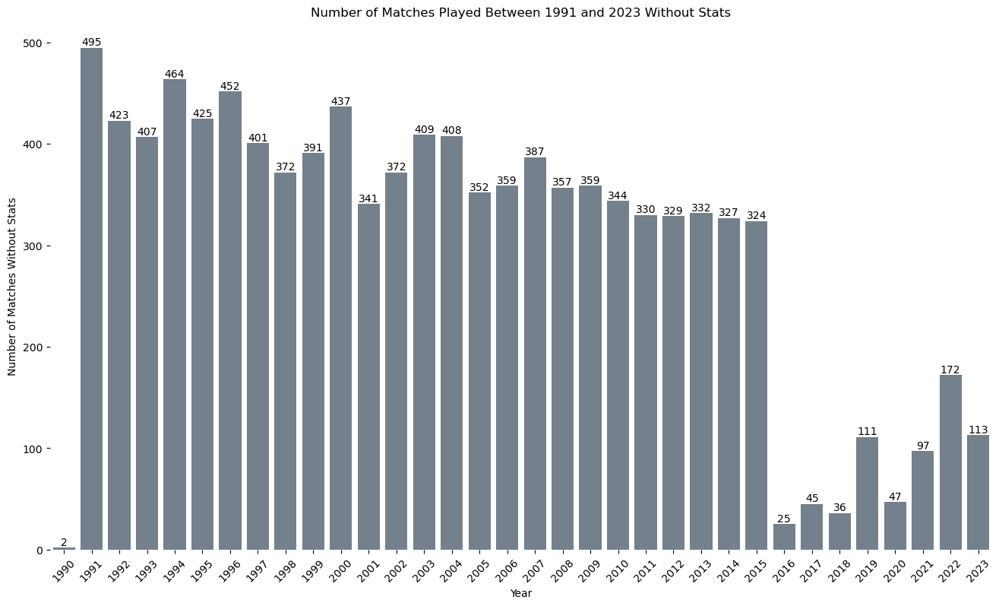

In [15]:
# Creating the plot
plt.figure(figsize=(16, 9))
NA_by_year_barplot = sns.barplot(data=number_of_NA_by_year_and_tourney_level_df, x="Year", y="number_of_NA", errorbar=None, estimator="sum", color="slategray")

# Removing the frame
sns.despine(left=True, bottom=True)

# Adding Bar's Labels
NA_by_year_barplot.bar_label(NA_by_year_barplot.containers[0], label_type='edge')

# Rotating tick labels of the X axis
plt.xticks(rotation=45)

# Titles
NA_by_year_barplot.set_xlabel("Year")
NA_by_year_barplot.set_ylabel("Number of Matches Without Stats")
NA_by_year_barplot.set_title("Number of Matches Played Between 1991 and 2023 Without Stats")

# Showing the plot
plt.show()
     

_Plotting the number of NA's by tourney level_

Tournament Type Abbreviations:

_G: Grand Slams_

_D: Davis Cup_

_M: Masters 1000s_

_A: Other tour-level events_

_F: Tour finals and other season-ending events_

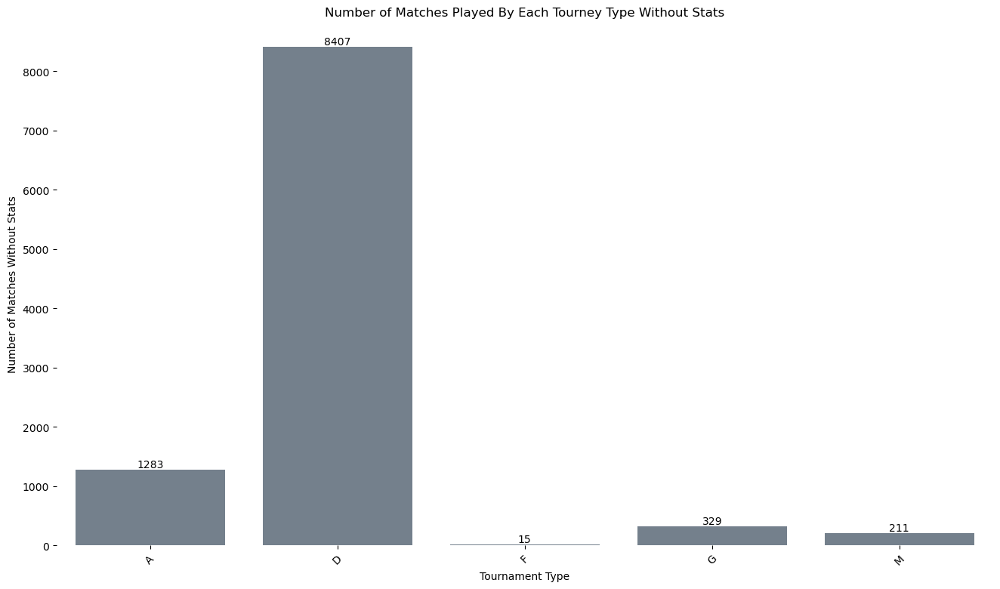

In [16]:
# Creating the plot
plt.figure(figsize=(16, 9))
NA_by_tourney_level_barplot = sns.barplot(data=number_of_NA_by_year_and_tourney_level_df, x="tourney_level", y="number_of_NA", errorbar=None, estimator="sum", color="slategray")

# Removing the frame
sns.despine(left=True, bottom=True)

# Adding Bar's Labels
NA_by_tourney_level_barplot.bar_label(NA_by_tourney_level_barplot.containers[0], label_type='edge')

# Rotating tick labels of the X axis
plt.xticks(rotation=45)

# Titles
NA_by_tourney_level_barplot.set_xlabel("Tournament Type")
NA_by_tourney_level_barplot.set_ylabel("Number of Matches Without Stats")
NA_by_tourney_level_barplot.set_title("Number of Matches Played By Each Tourney Type Without Stats")

# Showing the plot
plt.show()

_Plotting the number of NA's by both year and tourney level_

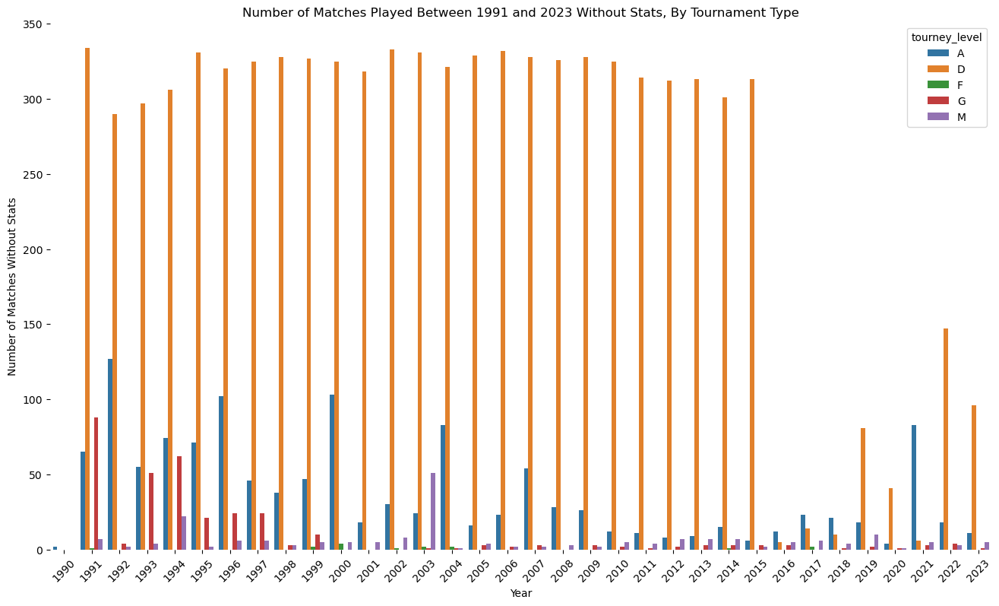

In [17]:

# Creating the plot
plt.figure(figsize=(16, 9))
NA_by_year_and_tourney_level_barplot = sns.barplot(data=number_of_NA_by_year_and_tourney_level_df, x="Year", y="number_of_NA", hue="tourney_level", estimator="sum")

# Removing the frame
sns.despine(left=True, bottom=True)

# Rotating tick labels of the X axis
plt.xticks(rotation=45)

# Titles
NA_by_year_and_tourney_level_barplot.set_xlabel("Year")
NA_by_year_and_tourney_level_barplot.set_ylabel("Number of Matches Without Stats")
NA_by_year_and_tourney_level_barplot.set_title("Number of Matches Played Between 1991 and 2023 Without Stats, By Tournament Type")

# Showing the plot
plt.show()

_The most number of NA's comes from the matches conducted during the Davis Cup events, mainly from 1990 to 2015._

_Further counting the number of matches per event type_

In [18]:
combined_df["tourney_level"].value_counts()

tourney_level
A    60153
M    17904
G    16637
D     9461
F      527
Name: count, dtype: int64

_Deleleting the matches (rows) that we don't have statistics_ 

In [3]:
combined_df.dropna(subset=match_stats_columns_names, inplace=True)

combined_df[match_stats_columns_names].isna().sum() 

NameError: name 'combined_df' is not defined

_Deleting matches (rows) conducted in davis cup or tour finals and other season-ending events:_

In [20]:
combined_df.drop(combined_df[(combined_df["tourney_level"] == "D") | (combined_df["tourney_level"] == "F")].index, inplace=True)

combined_df.head(10)

#### Handling missing data in 2 ways:
* Deleting the rows if they had NA values in the statistics columns. OR
* Deleting rows if the matches was conducted during the Davis Cup/ Tour finals and other season-ending events.

#### Data Type Conversion

_Converting columns from float64 to int64_

In [21]:
for col in match_stats_columns_names:
    combined_df[col] = pd.to_numeric(combined_df[col], downcast='integer')

combined_df.dtypes

tourney_id                                object
tourney_name                              object
surface                                   object
tourney_level                             object
tourney_date                      datetime64[ns]
winner_id                                  int64
winner_name                               object
winner_ht                                float64
winner_age                               float64
loser_id                                   int64
loser_name                                object
loser_ht                                 float64
loser_age                                float64
score                                     object
best_of                                    int64
round                                     object
minutes                                  float64
w_ace                                       int8
w_df                                        int8
w_svpt                                     int16
w_1stIn             

_Checking whether the descriptive statistics of some of the variables changed after the data type conversion:_

In [22]:
combined_df[match_stats_columns_names].describe()

,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,total_points,w_1st_serve_in_percentage,l_1st_serve_in_percentage,w_1st_serve_winning_percentage,l_1st_serve_winning_percentage
count,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.000000,92871.00000,92871.000000,92871.000000,92871.000000,92871.000000
mean,6.515478,2.733846,78.093032,47.623919,35.901982,16.723832,12.398165,3.528852,5.167501,4.835395,3.486137,80.931238,48.048573,31.928105,14.987047,12.205145,4.811319,8.736689,159.02427,61.012371,59.120279,76.443818,65.647191
std,5.336922,2.363840,29.481801,19.209607,13.835373,6.978315,4.117422,3.084574,4.057284,4.674849,2.620162,29.379388,19.345780,14.427081,7.203001,4.122113,3.273036,4.125879,57.29506,8.602344,8.673395,8.334321,9.770657
min,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,-6.000000,0.000000,6.00000,12.500000,12.500000,0.000000,0.000000
25%,3.000000,1.000000,56.000000,34.000000,26.000000,12.000000,9.000000,1.000000,2.000000,2.000000,2.000000,59.000000,34.000000,22.000000,10.000000,9.000000,2.000000,6.000000,116.00000,55.263000,53.425000,70.732000,59.551000
50%,5.000000,2.000000,73.000000,44.000000,33.000000,16.000000,11.000000,3.000000,4.000000,4.000000,3.000000,76.000000,45.000000,29.000000,14.000000,11.000000,4.000000,8.000000,148.00000,60.976000,59.130000,76.471000,66.000000
75%,9.000000,4.000000,94.000000,58.000000,43.000000,21.000000,15.000000,5.000000,7.000000,7.000000,5.000000,97.000000,58.000000,40.000000,19.000000,15.000000,7.000000,11.000000,191.00000,66.667000,64.815000,82.143000,72.308000
max,113.000000,26.000000,491.000000,361.000000,292.000000,82.000000,90.000000,24.000000,34.000000,103.000000,26.000000,489.000000,328.000000,284.000000,101.000000,91.000000,28.000000,35.000000,980.00000,100.000000,100.000000,100.000000,100.000000


_Getting the number of rows and columns in the dataset (post-cleaning):_

In [28]:
number_of_new_columns_added = 8 # Note that this doesn't automatically counts the numebr of new columns added to the DF. Update if necessary
number_of_rows_post_cleaning = combined_df.shape[0]
number_of_columns_post_cleaning = combined_df.shape[1] - number_of_new_columns_added

print(f"The dataset has {number_of_rows_post_cleaning} rows and {number_of_columns_post_cleaning+number_of_new_columns_added} columns.")
print(f"{number_of_rows_pre_cleaning-number_of_rows_post_cleaning} rows were deleted and {number_of_columns_pre_cleaning-number_of_columns_post_cleaning} columns were removed. {number_of_new_columns_added} new columns were created based on existing variabels.")
     

The dataset has 92871 rows and 47 columns.
11811 rows were deleted and 10 columns were removed. 8 new columns were created based on existing variabels.


#### __Creating a subset used in the multivariate analysis:__

In [55]:
col_names_multivariate_df = ["w_ace", "w_df", "w_svpt", "w_1stIn", "w_1stWon", "w_2ndWon", "w_SvGms", "w_bpSaved", "w_bpFaced", "l_ace", "l_df", "l_svpt", "l_1stIn", "l_1stWon", "l_2ndWon", "l_SvGms", "l_bpSaved", "l_bpFaced", "winner_ht", "winner_age", "loser_ht", "loser_age", "minutes", "total_points", "w_1st_serve_in_percentage", "l_1st_serve_in_percentage", "w_1st_serve_winning_percentage", "l_1st_serve_winning_percentage"]

multivariate_analysis_df = combined_df[col_names_multivariate_df]

multivariate_analysis_df.head()

,w_ace,w_df,w_svpt,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_bpSaved,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_ht,winner_age,loser_ht,loser_age,minutes,total_points,w_1st_serve_in_percentage,l_1st_serve_in_percentage,w_1st_serve_winning_percentage,l_1st_serve_winning_percentage
0,3,3,77,44,31,17,13,3,6,8,6,100,54,34,20,14,10,15,178.0,29.0,198.0,22.8,124.0,177,57.143,54.000,70.455,62.963
1,10,1,52,33,28,14,10,0,1,17,2,77,52,36,7,10,10,13,198.0,22.8,188.0,33.7,82.0,129,63.462,67.532,84.848,69.231
2,2,2,47,33,26,9,8,2,2,10,3,46,27,15,6,8,1,5,178.0,29.0,188.0,31.8,66.0,93,70.213,58.696,78.788,55.556
3,12,2,68,43,34,15,11,4,5,1,2,81,60,38,9,11,4,6,188.0,33.7,183.0,19.8,106.0,149,63.235,74.074,79.070,63.333
4,12,3,105,68,48,25,16,8,8,29,5,94,56,46,19,15,2,4,198.0,22.8,196.0,28.0,129.0,199,64.762,59.574,70.588,82.143


#### __Creating a new subset for the 1st serve in percentage by surface analysis:__

In [64]:
first_serve_in_melted_df = pd.melt(combined_df, id_vars =["winner_id","winner_name", "loser_id", "loser_name", "Year", "surface", "tourney_level"], value_vars=["w_1st_serve_in_percentage", "l_1st_serve_in_percentage"])
first_serve_in_melted_df.rename(columns={"variable": "winner_or_loser", "value": "first_serve_percentage"}, inplace=True)

first_serve_in_melted_df.sort_values(["winner_name", "loser_name"]).tail(10)

,winner_id,winner_name,loser_id,loser_name,Year,surface,tourney_level,winner_or_loser,first_serve_percentage
11431,200267,Zizou Bergs,105077,Albert Ramos,2020,Hard,A,w_1st_serve_in_percentage,70.130
104302,200267,Zizou Bergs,105077,Albert Ramos,2020,Hard,A,l_1st_serve_in_percentage,68.182
6900,200267,Zizou Bergs,200514,Jurij Rodionov,2023,Clay,A,w_1st_serve_in_percentage,67.521
99771,200267,Zizou Bergs,200514,Jurij Rodionov,2023,Clay,A,l_1st_serve_in_percentage,53.922
6911,200267,Zizou Bergs,111513,Laslo Djere,2023,Clay,A,w_1st_serve_in_percentage,64.103
99782,200267,Zizou Bergs,111513,Laslo Djere,2023,Clay,A,l_1st_serve_in_percentage,62.887
16953,200267,Zizou Bergs,106214,Oscar Otte,2021,Clay,A,w_1st_serve_in_percentage,69.333
109824,200267,Zizou Bergs,106214,Oscar Otte,2021,Clay,A,l_1st_serve_in_percentage,58.824
7046,200436,Zsombor Piros,106331,Christopher Oconnell,2023,Clay,A,w_1st_serve_in_percentage,63.934
99917,200436,Zsombor Piros,106331,Christopher Oconnell,2023,Clay,A,l_1st_serve_in_percentage,65.455


#### __Creating a new subset: wins on 1st serve percentage, by surface and event type:__

In [74]:
wins_on_first_serve_melted_df = pd.melt(combined_df, id_vars =["winner_id","winner_name", "loser_id", "loser_name", "Year", "surface", "tourney_level"], value_vars=["w_1st_serve_winning_percentage", "l_1st_serve_winning_percentage"])
wins_on_first_serve_melted_df.rename(columns={"variable": "winner_or_loser", "value": "first_serve_wins_percentage"}, inplace=True)

wins_on_first_serve_melted_df.sort_values(["winner_name", "loser_name"]).tail(10)

,winner_id,winner_name,loser_id,loser_name,Year,surface,tourney_level,winner_or_loser,first_serve_wins_percentage
11431,200267,Zizou Bergs,105077,Albert Ramos,2020,Hard,A,w_1st_serve_winning_percentage,61.111
104302,200267,Zizou Bergs,105077,Albert Ramos,2020,Hard,A,l_1st_serve_winning_percentage,60.000
6900,200267,Zizou Bergs,200514,Jurij Rodionov,2023,Clay,A,w_1st_serve_winning_percentage,72.152
99771,200267,Zizou Bergs,200514,Jurij Rodionov,2023,Clay,A,l_1st_serve_winning_percentage,80.000
6911,200267,Zizou Bergs,111513,Laslo Djere,2023,Clay,A,w_1st_serve_winning_percentage,78.000
99782,200267,Zizou Bergs,111513,Laslo Djere,2023,Clay,A,l_1st_serve_winning_percentage,60.656
16953,200267,Zizou Bergs,106214,Oscar Otte,2021,Clay,A,w_1st_serve_winning_percentage,75.000
109824,200267,Zizou Bergs,106214,Oscar Otte,2021,Clay,A,l_1st_serve_winning_percentage,62.500
7046,200436,Zsombor Piros,106331,Christopher Oconnell,2023,Clay,A,w_1st_serve_winning_percentage,76.923
99917,200436,Zsombor Piros,106331,Christopher Oconnell,2023,Clay,A,l_1st_serve_winning_percentage,69.444


_Exporting all the dataframes to CSV files:_

In [30]:
folder_path_to_export = '/Users/tejalpatel/Desktop/Tennis_Data_Analysis/processed_datasets'

# Exporting the combined_df
combined_df.to_csv(path_or_buf=folder_path_to_export+"/combined_and_cleaned_df.csv")

## Univariarte Analysis
* It explores each variable in a dataset, separately.
* It looks at the range of values, as well as the central tendency of the values.
* It describes the pattern of response to the variable.
* it describes each variable on its own.
### Categorical Variables
#### Number of Matches by Surface Type

_Counting the number of games played on each surface:_

In [32]:
combined_df["surface"].value_counts()

surface
Hard      46623
Clay      30756
Grass      9743
Carpet     5749
Name: count, dtype: int64

_Proportion of matches played on each surface:_

In [34]:
combined_df["surface"].value_counts(normalize=True)    

surface
Hard      0.502019
Clay      0.331169
Grass     0.104909
Carpet    0.061903
Name: proportion, dtype: float64

_Plotting the number of games played on each surface type:_

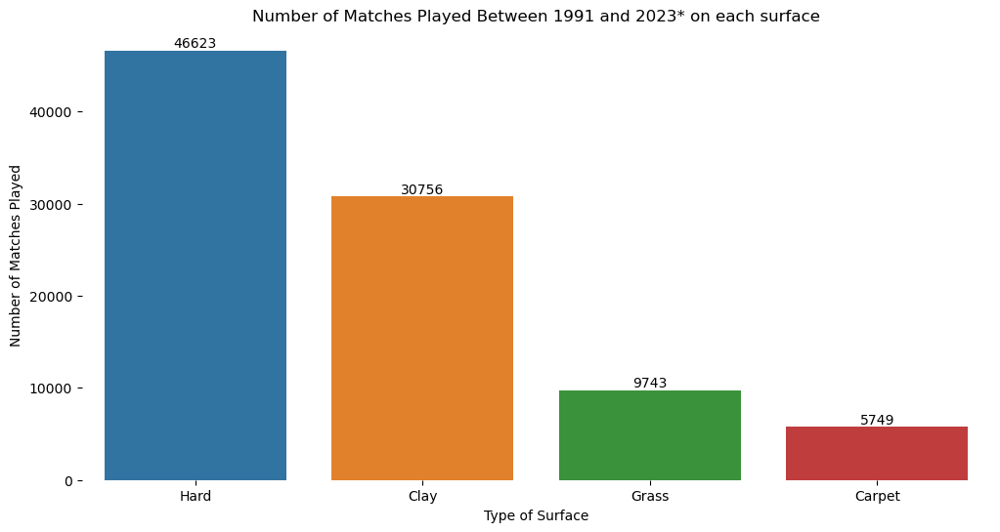

In [35]:
# Creating the plot
plt.figure(figsize=(12,6))
surfaces_countplot = sns.countplot(data=combined_df, x="surface", order=combined_df.surface.value_counts().index)

# Removing the frame
sns.despine(left=True, bottom=True)

# Adding Bar's Labels
surfaces_countplot.bar_label(surfaces_countplot.containers[0], label_type='edge')

# Titles
surfaces_countplot.set_xlabel("Type of Surface")
surfaces_countplot.set_ylabel("Number of Matches Played")
surfaces_countplot.set_title("Number of Matches Played Between 1991 and 2023* on each surface")

# Showing the plot
plt.show()

#### Number of Matches by Surface Type

_Counting the number of matches in each tournament type:_

In [36]:
combined_df["tourney_level"].value_counts()

tourney_level
A    58870
M    17693
G    16308
Name: count, dtype: int64

_Proportion of tournament type:_

In [37]:
combined_df["tourney_level"].value_counts(normalize=True)

tourney_level
A    0.633890
M    0.190512
G    0.175598
Name: proportion, dtype: float64

_Plotting_

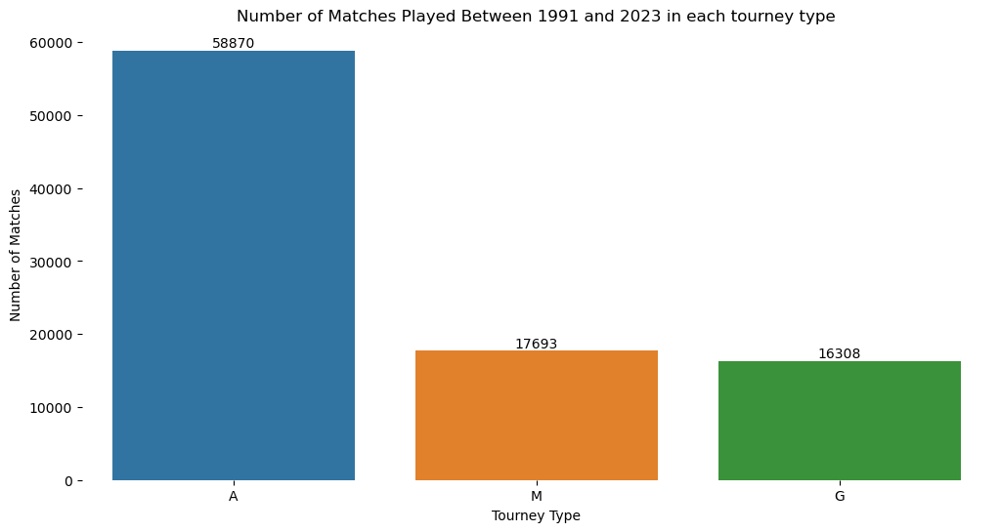

In [38]:
# Creating the plot
plt.figure(figsize=(12,6))
tourney_level_countplot = sns.countplot(data=combined_df, x="tourney_level", order=combined_df["tourney_level"].value_counts().index)

# Removing the frame
sns.despine(left=True, bottom=True)

# Adding Bar's Labels
tourney_level_countplot.bar_label(tourney_level_countplot.containers[0], label_type='edge')

# Titles
tourney_level_countplot.set_xlabel("Tourney Type")
tourney_level_countplot.set_ylabel("Number of Matches")
tourney_level_countplot.set_title("Number of Matches Played Between 1991 and 2023 in each tourney type")

# Showing the plot
plt.show()

## Numerical Variables
### Analyzing the total_points variable:
_Descriptive Statistics:_

In [39]:
round(combined_df["total_points"].describe(), 2)

count    92871.00
mean       159.02
std         57.30
min          6.00
25%        116.00
50%        148.00
75%        191.00
max        980.00
Name: total_points, dtype: float64

_Skewness and Kurtosis:_

In [40]:
total_points_skewness = combined_df.total_points.skew()
total_points_kurtosis = combined_df.total_points.kurtosis()

print(f"Skewness: {round(total_points_skewness, 3)}")
print(f"Kurtosis: {round(total_points_kurtosis, 3)}")

Skewness: 1.129
Kurtosis: 2.194


_Plotting:_

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


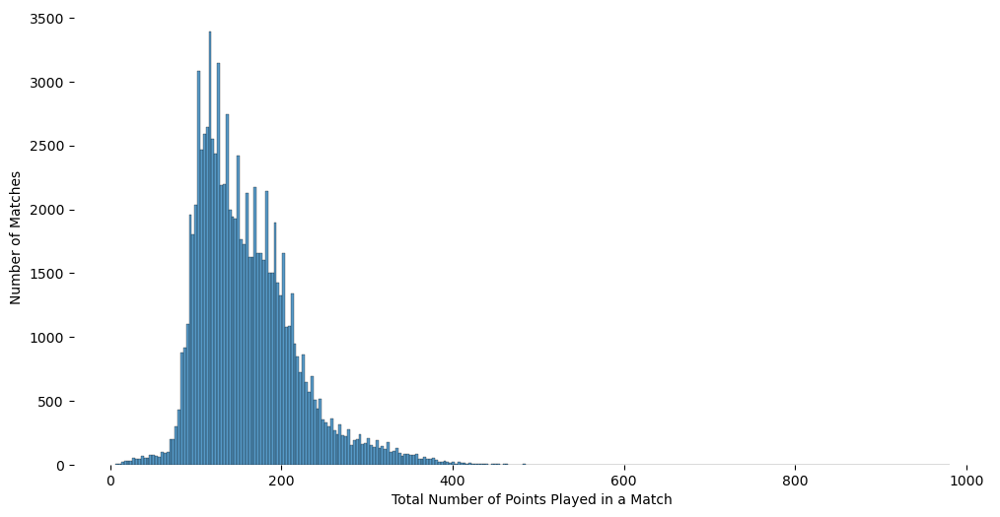

In [41]:
# Creating the plot
plt.figure(figsize=(12, 6))
total_point_histogram = sns.histplot(data=combined_df, x="total_points")

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
total_point_histogram.set_xlabel("Total Number of Points Played in a Match")
total_point_histogram.set_ylabel("Number of Matches")

# Showing the plot
plt.show()

### Analyzing the w_1st_serve_in_percentage variable:
_Descriptive Statitics:_

In [42]:
round(combined_df["w_1st_serve_in_percentage"].describe(), 2)

count    92871.00
mean        61.01
std          8.60
min         12.50
25%         55.26
50%         60.98
75%         66.67
max        100.00
Name: w_1st_serve_in_percentage, dtype: float64

_Skewness and Kurtosis:_

In [43]:
w_1st_serve_in_percentage_skewness = combined_df["w_1st_serve_in_percentage"].skew()
w_1st_serve_in_percentage_kurtosis = combined_df["w_1st_serve_in_percentage"].kurtosis()

print(f"Skewness: {round(w_1st_serve_in_percentage_skewness, 3)}")
print(f"Kurtosis: {round(w_1st_serve_in_percentage_kurtosis, 3)}")

Skewness: 0.072
Kurtosis: 0.224


_Plotting:_

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


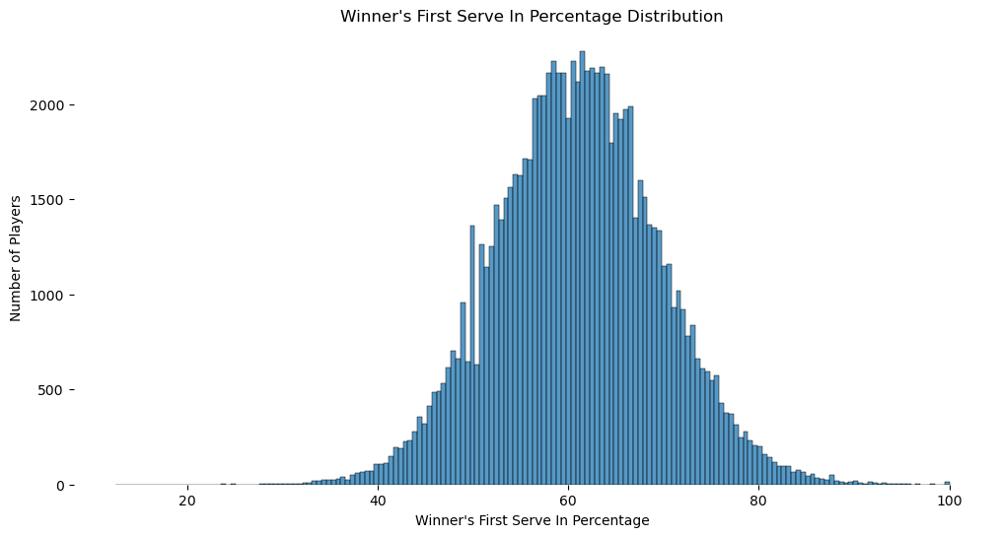

In [44]:
# Creating the plot
plt.figure(figsize=(12, 6))
w_1st_serve_in_percentage_histogram = sns.histplot(data=combined_df, x="w_1st_serve_in_percentage")

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
w_1st_serve_in_percentage_histogram.set_xlabel("Winner's First Serve In Percentage")
w_1st_serve_in_percentage_histogram.set_ylabel("Number of Players")
w_1st_serve_in_percentage_histogram.set_title("Winner's First Serve In Percentage Distribution")

# Showing the plot
plt.show()

### Analyzing the l_1st_serve_in_percentage variable:
_Descriptive Statistics:_

In [45]:
round(combined_df["l_1st_serve_in_percentage"].describe(), 2)

count    92871.00
mean        59.12
std          8.67
min         12.50
25%         53.42
50%         59.13
75%         64.82
max        100.00
Name: l_1st_serve_in_percentage, dtype: float64

_Skewness and Kurtosis:_

In [46]:
l_1st_serve_in_percentage_skewness = combined_df["l_1st_serve_in_percentage"].skew()
l_1st_serve_in_percentage_kurtosis = combined_df["l_1st_serve_in_percentage"].kurtosis()

print(f"Skewness: {round(l_1st_serve_in_percentage_skewness, 3)}")
print(f"Kurtosis: {round(l_1st_serve_in_percentage_kurtosis, 3)}")

Skewness: 0.025
Kurtosis: 0.322


_Plotting:_

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


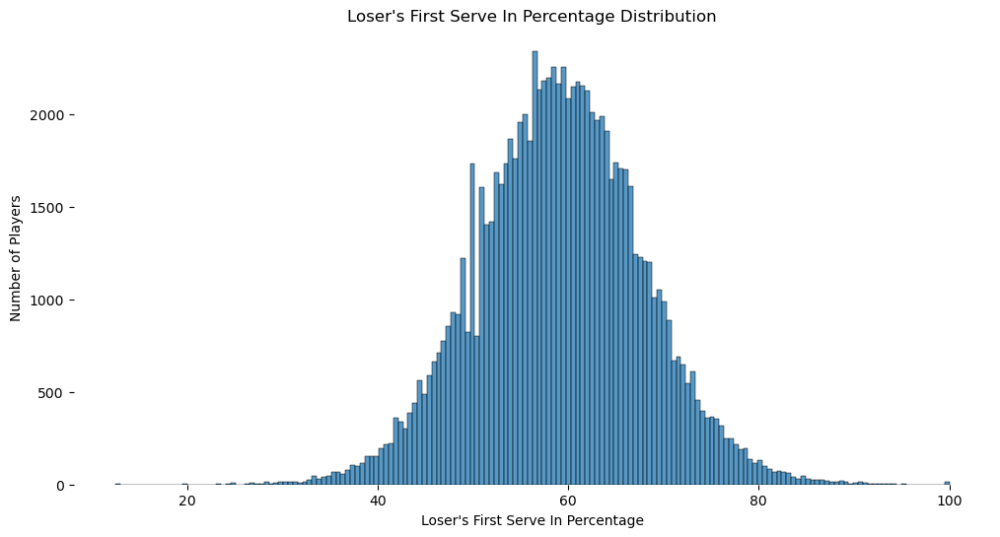

In [47]:
# Creating the plot
plt.figure(figsize=(12, 6))
l_1st_serve_in_percentage_histogram = sns.histplot(data=combined_df, x="l_1st_serve_in_percentage")

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
l_1st_serve_in_percentage_histogram.set_xlabel("Loser's First Serve In Percentage")
l_1st_serve_in_percentage_histogram.set_ylabel("Number of Players")
l_1st_serve_in_percentage_histogram.set_title("Loser's First Serve In Percentage Distribution")

# Showing the plot
plt.show()

### Analyzing the w_1st_serve_winning_percentage variable:
_Descriptive Statistics:_

In [48]:
round(combined_df["w_1st_serve_winning_percentage"].describe(), 2)
     

count    92871.00
mean        76.44
std          8.33
min          0.00
25%         70.73
50%         76.47
75%         82.14
max        100.00
Name: w_1st_serve_winning_percentage, dtype: float64

_Skewness and Kurtosis:_

In [49]:
w_1st_serve_winning_percentage_skewness = combined_df["w_1st_serve_winning_percentage"].skew()
w_1st_serve_winning_percentage_kurtosis = combined_df["w_1st_serve_winning_percentage"].kurtosis()

print(f"Skewness: {round(w_1st_serve_winning_percentage_skewness, 2)}")
print(f"Kurtosis: {round(w_1st_serve_winning_percentage_kurtosis, 2)}")

Skewness: -0.04
Kurtosis: 0.07


_Plotting_

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


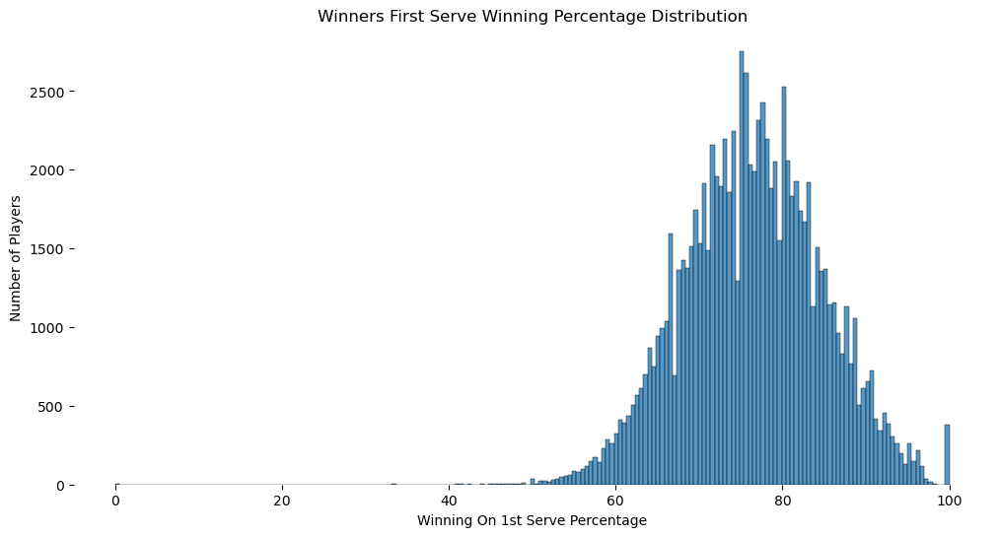

In [50]:
# Creating the plot
plt.figure(figsize=(12, 6))
w_1st_serve_winning_percentage_histogram = sns.histplot(data=combined_df, x="w_1st_serve_winning_percentage")

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
w_1st_serve_winning_percentage_histogram.set_xlabel("Winning On 1st Serve Percentage")
w_1st_serve_winning_percentage_histogram.set_ylabel("Number of Players")
w_1st_serve_winning_percentage_histogram.set_title("Winners First Serve Winning Percentage Distribution")

# Showing the plot
plt.show()

### Analyzing the l_1st_serve_winning_percentage variable:
_Descriptive Statistics:_

In [51]:
round(combined_df["l_1st_serve_winning_percentage"].describe(), 2)

count    92871.00
mean        65.65
std          9.77
min          0.00
25%         59.55
50%         66.00
75%         72.31
max        100.00
Name: l_1st_serve_winning_percentage, dtype: float64

_Skewness and Kurtosis:_

In [52]:
l_1st_serve_winning_percentage_skewness = combined_df["l_1st_serve_winning_percentage"].skew()
l_1st_serve_winning_percentage_kurtosis = combined_df["l_1st_serve_winning_percentage"].kurtosis()

print(f"Skewness: {round(l_1st_serve_winning_percentage_skewness, 2)}")
print(f"Kurtosis: {round(l_1st_serve_winning_percentage_kurtosis, 2)}")

Skewness: -0.4
Kurtosis: 0.92


_Plotting:_

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


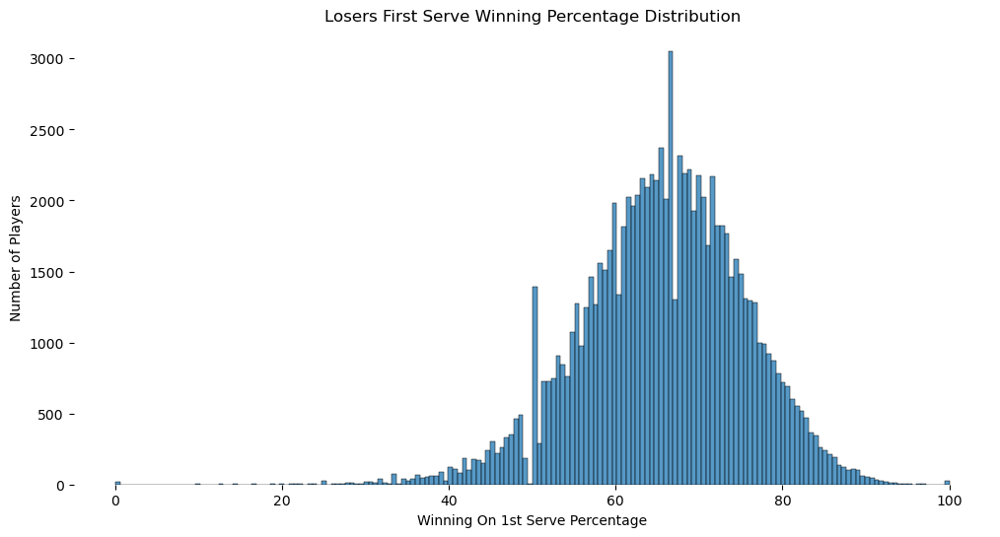

In [53]:
# Creating the plot
plt.figure(figsize=(12, 6))
l_1st_serve_winning_percentage_histogram = sns.histplot(data=combined_df, x="l_1st_serve_winning_percentage")

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
l_1st_serve_winning_percentage_histogram.set_xlabel("Winning On 1st Serve Percentage")
l_1st_serve_winning_percentage_histogram.set_ylabel("Number of Players")
l_1st_serve_winning_percentage_histogram.set_title("Losers First Serve Winning Percentage Distribution")

# Showing the plot
plt.show()

## Bivariate Analysis:
### Finding trends in the numeric variables:
* The goal of the pairplot visualization is to examine the relationships between all the numric variabels in the dataset. Though in many cases a correlation matrix is used to do so, I prefer to do this visualization in order to see if there's any non linear correlations between any variabels.

_Creating a pairplot visualization:_

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

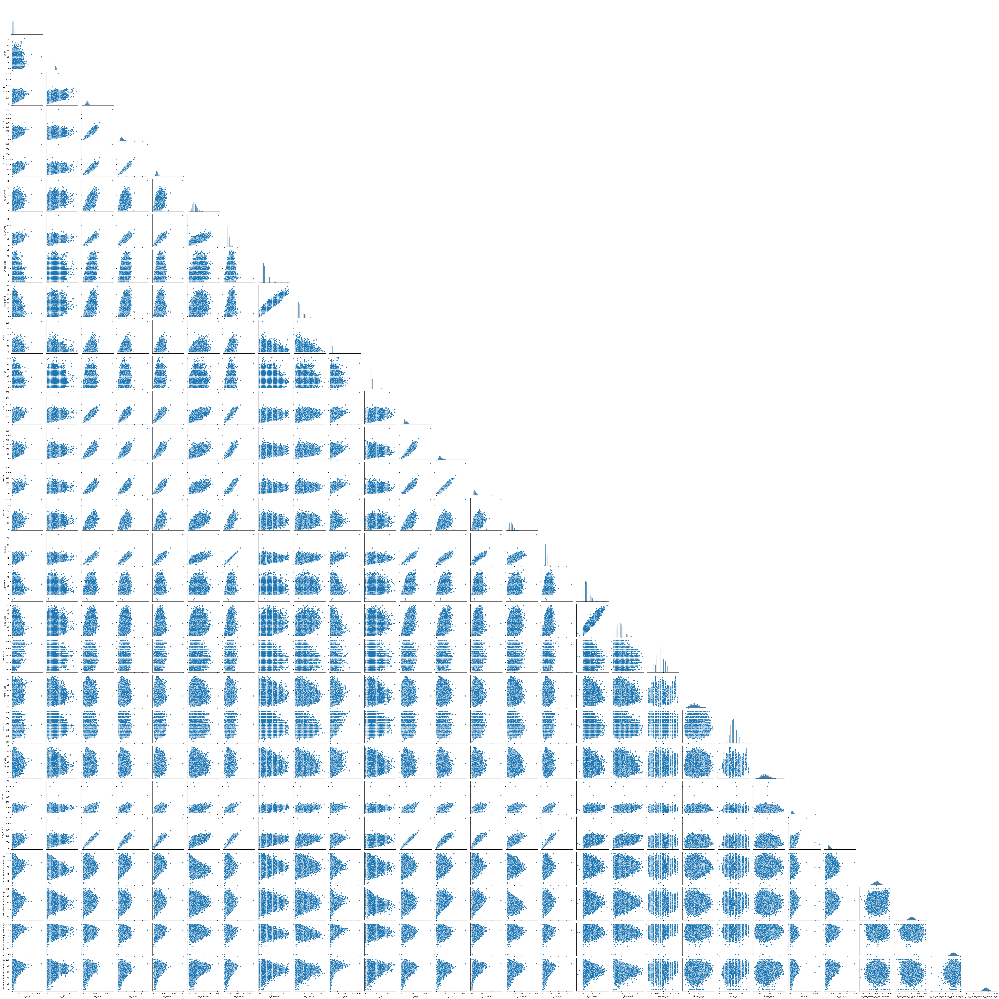

In [57]:
pairplot = sns.pairplot(multivariate_analysis_df, corner=True)
plt.show()

_Creating a correlation matrix:_

In [ ]:
corr_matrix = round(multivariate_analysis_df.corr(),2)

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(20,12))
sns.heatmap(corr_matrix, annot=True, mask=mask, square=True, linewidths=2)
plt.show()

### Conclusions drawn from the pairplot visualization and correlation matrix:
* After examining the pairplot visualization, it seems that the only type of relationships are linear.
* From examining the correlation matrix, it seems that there is a strong correlation between some variabels. All of the strong correlations make sense - the correlation between the length of the match in minutes to the total number of points played in the match (r=0.92), for example, is easy to explain: if the match is longer, it means the players has more time to play more points.

## Comparing the average number of total points played on each surface
_Calculating the average total number of points played on each surface:_

In [59]:
total_points_mean_by_surface_df = round(combined_df.groupby(["surface"], as_index=False)[["total_points"]].mean(), 2)
total_points_mean_by_surface_df.sort_values(by="total_points", ascending=False, inplace=True, ignore_index=True)
total_points_mean_by_surface_df

,surface,total_points
0,Grass,182.62
1,Hard,158.67
2,Clay,154.40
3,Carpet,146.64


_Plotting the total number of points played on each surface distribution:_

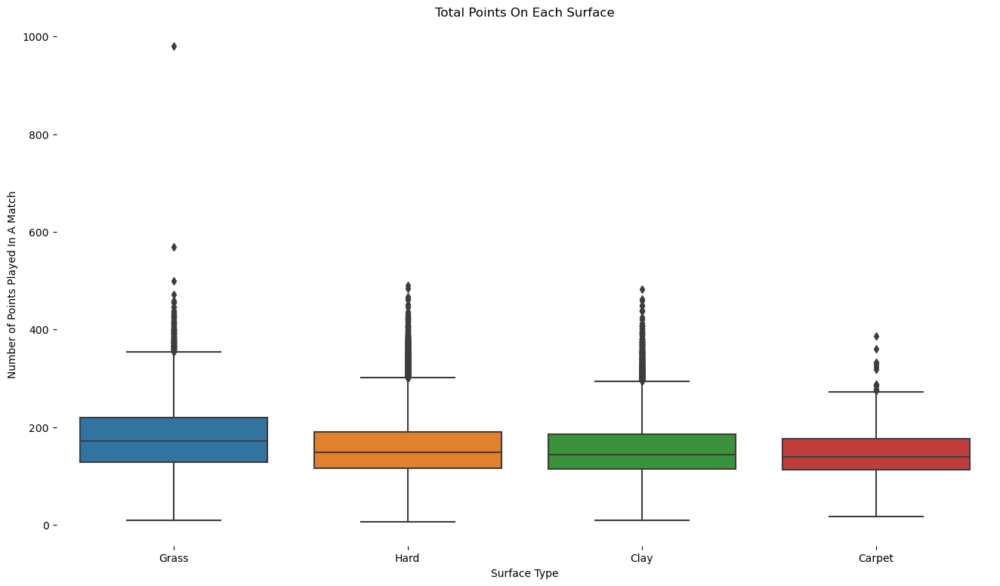

In [60]:
# Creating the plot
plt.figure(figsize=(16,9))
points_by_surface_plot = sns.boxplot(combined_df, x="surface", y="total_points", order=total_points_mean_by_surface_df["surface"])

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
points_by_surface_plot.set_xlabel("Surface Type")
points_by_surface_plot.set_ylabel("Number of Points Played In A Match")
points_by_surface_plot.set_title("Total Points On Each Surface")

# Showing the plot
plt.show()

## Comparing the average match length for each event
_Calculating the average total number of points played & the average length of matches by each tourney level:_

In [61]:
average_duration_by_tourney_level_df = round(combined_df.groupby(["tourney_level"], as_index=False)[["minutes", "total_points"]].mean(), 2)
average_duration_by_tourney_level_df.sort_values(by="minutes", ascending=False, inplace=True, ignore_index=True)
average_duration_by_tourney_level_df

,tourney_level,minutes,total_points
0,G,145.48,229.17
1,M,97.96,144.69
2,A,94.92,143.90


_Plotting the match length on each surface distribution:_

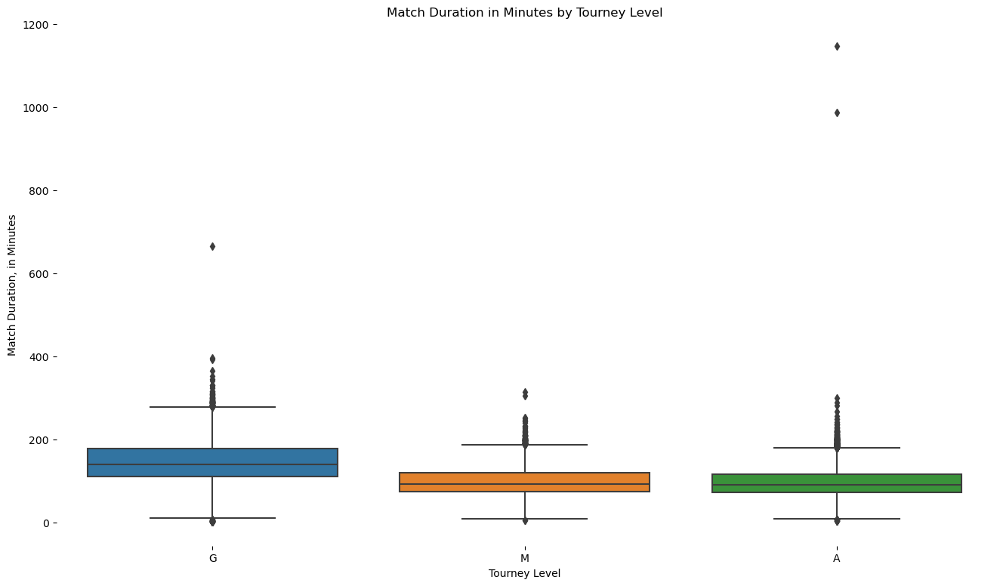

In [62]:
# Creating the plot
plt.figure(figsize=(16,9))
duration_by_tourney_level_plot = sns.boxplot(combined_df, x="tourney_level", y="minutes", order=average_duration_by_tourney_level_df["tourney_level"])

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
duration_by_tourney_level_plot.set_xlabel("Tourney Level")
duration_by_tourney_level_plot.set_ylabel("Match Duration, in Minutes")
duration_by_tourney_level_plot.set_title("Match Duration in Minutes by Tourney Level")

# Showing the plot
plt.show()

## First Serve Percentage Difference Between Winners and Losers:
_Calculating the average winners' and losers' first serve percentage:_

In [65]:
round(first_serve_in_melted_df.groupby(["winner_or_loser"], as_index=False).agg({"first_serve_percentage": ["mean", "median"]}), 2)    

winner_or_loser first_serve_percentage       
                                               mean median
0  l_1st_serve_in_percentage                  59.12  59.13
1  w_1st_serve_in_percentage                  61.01  60.98

_Plotting the winners' and losers' first serve percentage distribution:_

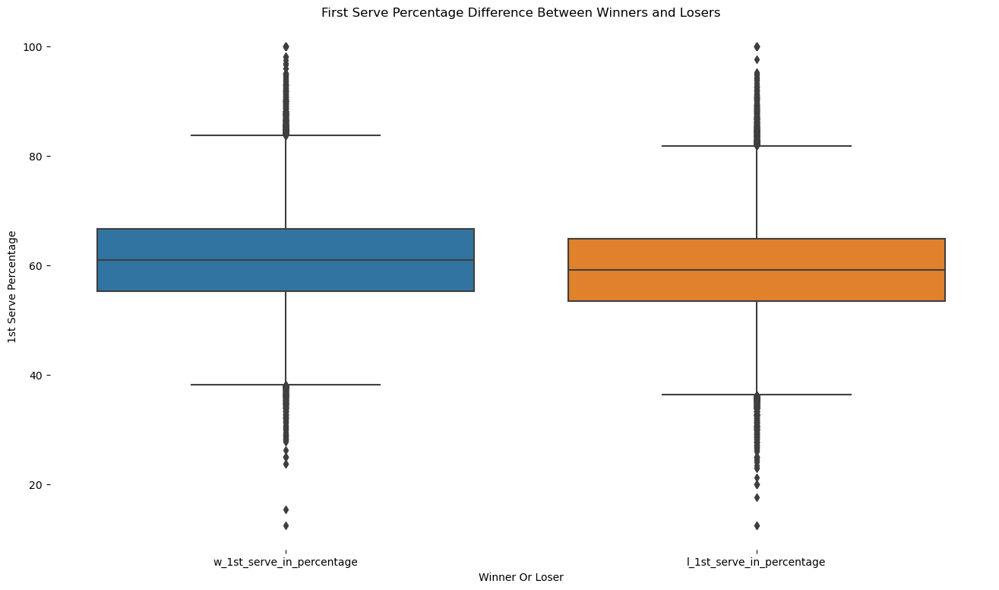

In [66]:
# Creating the plot
plt.figure(figsize=(16,9))
first_serve_percentage_winners_vs_losers_plot = sns.boxplot(data=combined_df[["w_1st_serve_in_percentage", "l_1st_serve_in_percentage"]])

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
first_serve_percentage_winners_vs_losers_plot.set_xlabel("Winner Or Loser")
first_serve_percentage_winners_vs_losers_plot.set_ylabel("1st Serve Percentage")
first_serve_percentage_winners_vs_losers_plot.set_title("First Serve Percentage Difference Between Winners and Losers")

# Showing the plot
plt.show()

## Comparing the 1st serve percentages per surface:
_Calculating the average and median winners' and losers' first serve percentage, per surface type:_

In [67]:
first_serve_by_surface_aggregated_df = round(first_serve_in_melted_df.groupby(["surface", "winner_or_loser"], as_index=False).agg({"first_serve_percentage": ["mean", "median"]}), 2)
first_serve_by_surface_aggregated_df.sort_values(by=["surface", ("first_serve_percentage", "median")], ascending=[True, False], inplace=True, ignore_index=True)
first_serve_by_surface_aggregated_df

surface            winner_or_loser first_serve_percentage       
                                                       mean median
0  Carpet  w_1st_serve_in_percentage                  59.09  58.97
1  Carpet  l_1st_serve_in_percentage                  57.28  57.29
2    Clay  w_1st_serve_in_percentage                  61.89  61.74
3    Clay  l_1st_serve_in_percentage                  60.00  60.00
4   Grass  w_1st_serve_in_percentage                  61.96  62.14
5   Grass  l_1st_serve_in_percentage                  60.06  60.32
6    Hard  w_1st_serve_in_percentage                  60.47  60.46
7    Hard  l_1st_serve_in_percentage                  58.57  58.65

_Plotting the winners' and losers' first serve percentage per surface type distribution:_

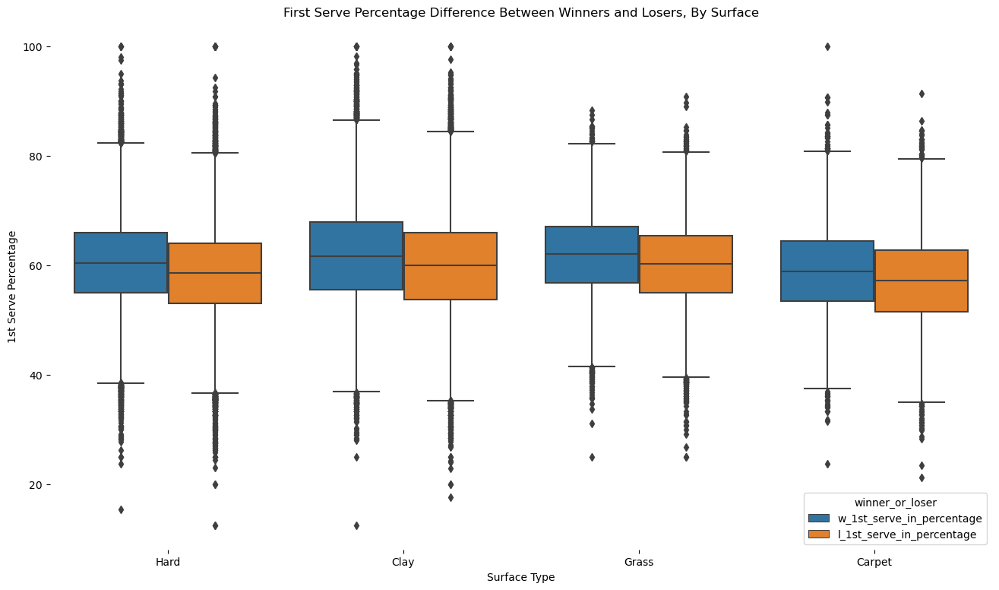

In [68]:
# Creating the plot
plt.figure(figsize=(16,9))
first_serve_percentage_by_surface_plot = sns.boxplot(data=first_serve_in_melted_df, x="surface", y="first_serve_percentage", hue="winner_or_loser")

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
first_serve_percentage_by_surface_plot.set_xlabel("Surface Type")
first_serve_percentage_by_surface_plot.set_ylabel("1st Serve Percentage")
first_serve_percentage_by_surface_plot.set_title("First Serve Percentage Difference Between Winners and Losers, By Surface")

# Showing the plot
plt.show()

## Comparing the 1st serve percentages per event type:
_Calculating the average and median winners' and losers' first serve percentage, per tourney type:_

In [69]:
first_serve_by_tourney_level_aggregated_df = round(first_serve_in_melted_df.groupby(["tourney_level", "winner_or_loser"], as_index=False).agg({"first_serve_percentage": ["mean", "median"]}), 2)
first_serve_by_tourney_level_aggregated_df.sort_values(by=["tourney_level", ("first_serve_percentage", "median")], ascending=[True, False], inplace=True, ignore_index=True)
first_serve_by_tourney_level_aggregated_df

tourney_level            winner_or_loser first_serve_percentage       
                                                             mean median
0             A  w_1st_serve_in_percentage                  60.83  60.74
1             A  l_1st_serve_in_percentage                  59.04  59.04
2             G  w_1st_serve_in_percentage                  61.96  61.98
3             G  l_1st_serve_in_percentage                  60.00  60.00
4             M  w_1st_serve_in_percentage                  60.74  60.66
5             M  l_1st_serve_in_percentage                  58.58  58.46

_Plotting the winners' and losers' first serve percentage per tourney type distribution:_

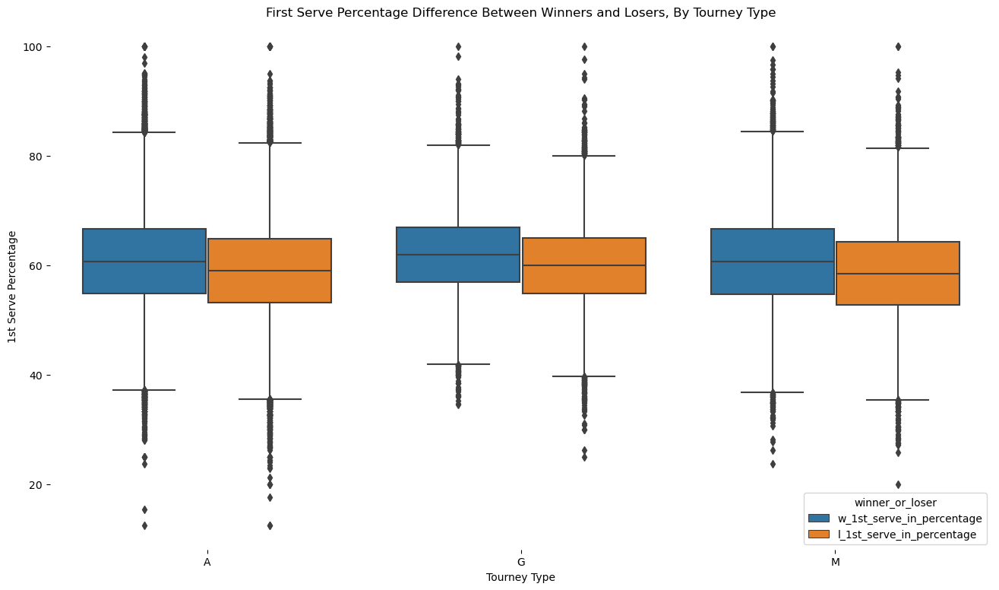

In [70]:
# Creating the plot
plt.figure(figsize=(16,9))
first_serve_percentage_by_event_type_plot = sns.boxplot(data=first_serve_in_melted_df, x="tourney_level", y="first_serve_percentage", hue="winner_or_loser")

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
first_serve_percentage_by_event_type_plot.set_xlabel("Tourney Type")
first_serve_percentage_by_event_type_plot.set_ylabel("1st Serve Percentage")
first_serve_percentage_by_event_type_plot.set_title("First Serve Percentage Difference Between Winners and Losers, By Tourney Type")

# Showing the plot
plt.show()

## Comparing wins on 1st serve Difference Between Winners and Losers
_Calculating the average winners' and losers' wins on first serve percentage:_

In [71]:
round(combined_df[["w_1st_serve_winning_percentage", "l_1st_serve_winning_percentage"]].mean(), 2)

w_1st_serve_winning_percentage    76.44
l_1st_serve_winning_percentage    65.65
dtype: float64

_Plotting the winners' and losers' wins on first serve percentage distribution:_

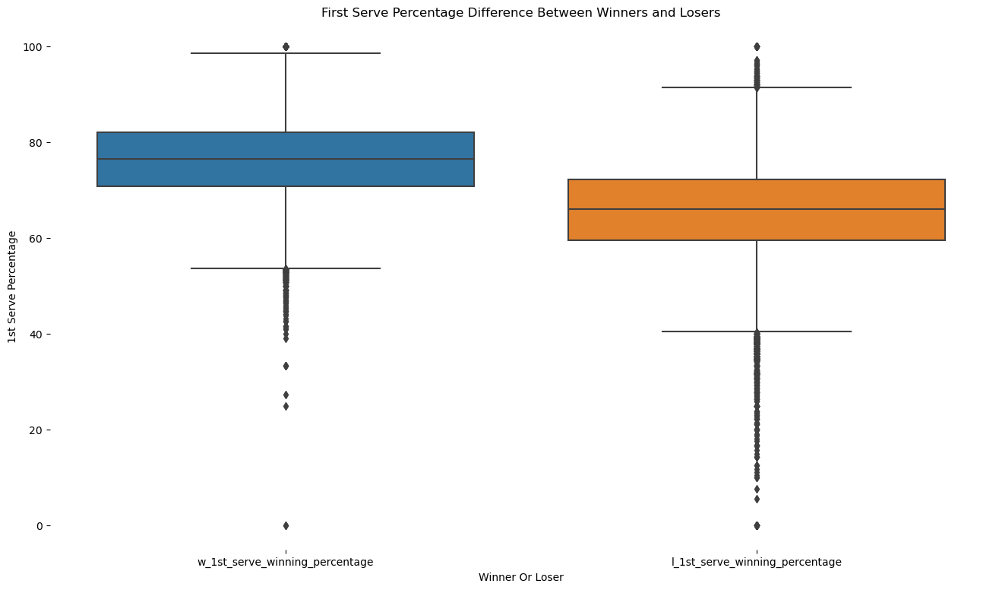

In [72]:
# Creating the plot
plt.figure(figsize=(16,9))
winning_first_serve_percentage_winners_vs_losers_plot = sns.boxplot(data=combined_df[["w_1st_serve_winning_percentage", "l_1st_serve_winning_percentage"]])

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
winning_first_serve_percentage_winners_vs_losers_plot.set_xlabel("Winner Or Loser")
winning_first_serve_percentage_winners_vs_losers_plot.set_ylabel("1st Serve Percentage")
winning_first_serve_percentage_winners_vs_losers_plot.set_title("First Serve Percentage Difference Between Winners and Losers")

# Showing the plot
plt.show()

## Comparing the winning on 1st serve percentages per surface
_Calculating the average and median winners' and losers' wins on first serve percentage, per surface type:_

In [75]:
winning_first_serve_by_surface_aggregated_df = round(wins_on_first_serve_melted_df.groupby(["surface", "winner_or_loser"], as_index=False).agg({"first_serve_wins_percentage": ["mean", "median"]}), 2)
winning_first_serve_by_surface_aggregated_df.sort_values(by=["surface", ("first_serve_wins_percentage", "median")], ascending=[True, False], inplace=True, ignore_index=True)
winning_first_serve_by_surface_aggregated_df

surface                 winner_or_loser first_serve_wins_percentage       
                                                                 mean median
0  Carpet  w_1st_serve_winning_percentage                       79.34  79.17
1  Carpet  l_1st_serve_winning_percentage                       68.72  69.23
2    Clay  w_1st_serve_winning_percentage                       73.53  73.33
3    Clay  l_1st_serve_winning_percentage                       62.44  62.86
4   Grass  w_1st_serve_winning_percentage                       79.27  79.31
5   Grass  l_1st_serve_winning_percentage                       69.13  69.44
6    Hard  w_1st_serve_winning_percentage                       77.42  77.42
7    Hard  l_1st_serve_winning_percentage                       66.65  67.06

_Plotting the winners' and losers' wins on first serve percentage per surface type distribution:_

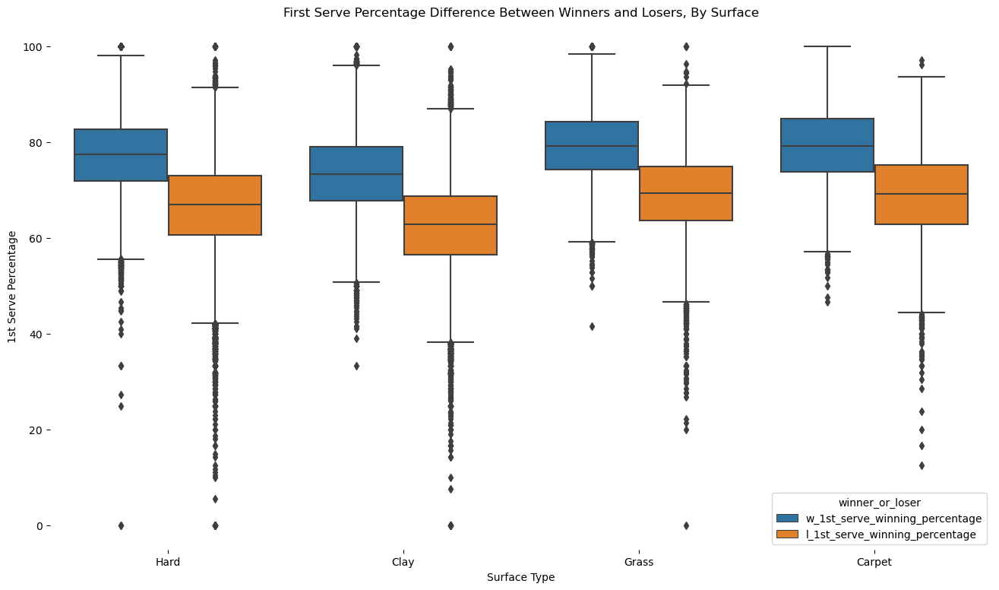

In [76]:
# Creating the plot
plt.figure(figsize=(16,9))
first_serve_percentage_by_surface_plot = sns.boxplot(data=wins_on_first_serve_melted_df, x="surface", y="first_serve_wins_percentage", hue="winner_or_loser")

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
first_serve_percentage_by_surface_plot.set_xlabel("Surface Type")
first_serve_percentage_by_surface_plot.set_ylabel("1st Serve Percentage")
first_serve_percentage_by_surface_plot.set_title("First Serve Percentage Difference Between Winners and Losers, By Surface")

# Showing the plot
plt.show()

## Comparing the winning on 1st serve percentages per event type
_Calculating the average and median winners' and losers' winning on first serve percentage, per tourney level:_

In [77]:
winning_first_serve_by_tourney_level_aggregated_df = round(wins_on_first_serve_melted_df.groupby(["tourney_level", "winner_or_loser"], as_index=False).agg({"first_serve_wins_percentage": ["mean", "median"]}), 2)
winning_first_serve_by_tourney_level_aggregated_df.sort_values(by=["tourney_level", ("first_serve_wins_percentage", "median")], ascending=[True, False], inplace=True, ignore_index=True)
winning_first_serve_by_tourney_level_aggregated_df

tourney_level                 winner_or_loser first_serve_wins_percentage  \
                                                                       mean   
0             A  w_1st_serve_winning_percentage                       76.36   
1             A  l_1st_serve_winning_percentage                       65.48   
2             G  w_1st_serve_winning_percentage                       77.02   
3             G  l_1st_serve_winning_percentage                       66.34   
4             M  w_1st_serve_winning_percentage                       76.19   
5             M  l_1st_serve_winning_percentage                       65.57   

          
  median  
0  76.32  
1  65.85  
2  77.00  
3  66.67  
4  76.19  
5  65.96

_Plotting the winners' and losers' wins on first serve percentage per tourney type distribution:_

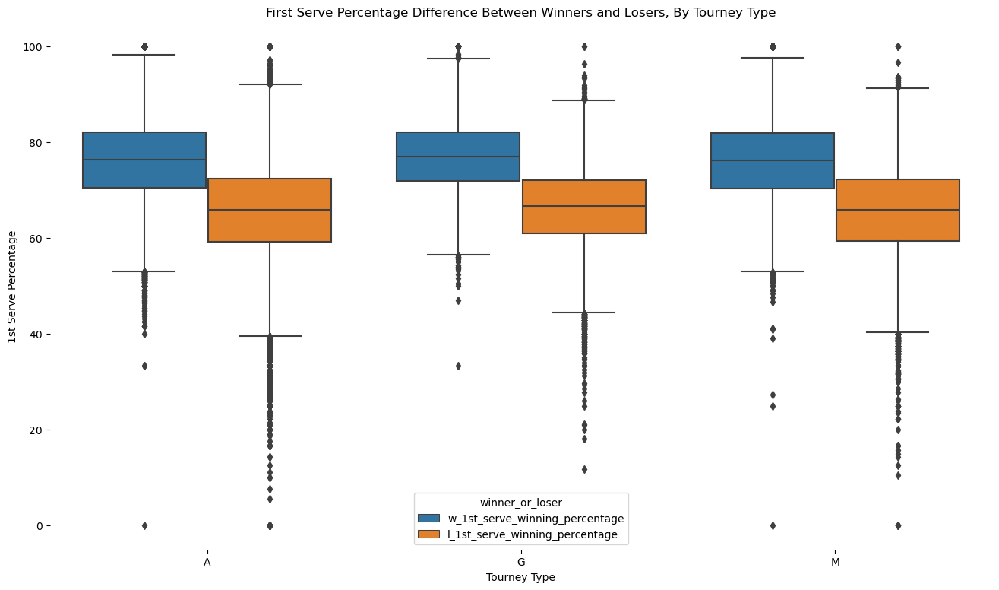

In [78]:
# Creating the plot
plt.figure(figsize=(16,9))
first_serve_percentage_by_event_type_plot = sns.boxplot(data=wins_on_first_serve_melted_df, x="tourney_level", y="first_serve_wins_percentage", hue="winner_or_loser")

# Removing the frame
sns.despine(left=True, bottom=True)

# Titles
first_serve_percentage_by_event_type_plot.set_xlabel("Tourney Type")
first_serve_percentage_by_event_type_plot.set_ylabel("1st Serve Percentage")
first_serve_percentage_by_event_type_plot.set_title("First Serve Percentage Difference Between Winners and Losers, By Tourney Type")

# Showing the plot
plt.show()